In [1]:
import os
from PIL import Image
from torchvision.transforms import ToTensor
import torch
from torch.autograd import Variable
from torch import nn
from torchvision.models.segmentation import deeplabv3_resnet50
from torch.utils.data import DataLoader
from tqdm import tqdm
import matplotlib.pyplot as plt
import numpy as np

In [2]:
def load_dataset(start_id, end_id):
    grayscale_dir = 'D:\github\Phase2Image\data\grayscale'
    phases_dir = 'D:\github\Phase2Image\data\phases'

    grayscale_images = []
    phase_images = []

    for i in range(start_id, end_id):
        grayscale_path = os.path.join(grayscale_dir, f'image_{i}.jpg')
        phase_path = os.path.join(phases_dir, f'image_{i}.jpg')

        grayscale_image = Image.open(grayscale_path).convert('L')
        phase_image = Image.open(phase_path).convert('L')

        grayscale_images.append(ToTensor()(grayscale_image))
        phase_images.append(ToTensor()(phase_image))

    return grayscale_images, phase_images

def split_dataset():
    grayscale_images, phase_images = load_dataset(0, 5000)
    train_grayscale = grayscale_images[:4500]
    train_phase = phase_images[:4500]

    test_grayscale = grayscale_images[4500:]
    test_phase = phase_images[4500:]

    return (train_grayscale, train_phase), (test_grayscale, test_phase)


def train_model(lr, batch_size, epochs):
    (train_grayscale, train_phase), (test_grayscale, test_phase) = split_dataset()
    train_loader = DataLoader(list(zip(train_grayscale, train_phase)), batch_size=batch_size, shuffle=True)
    test_loader = DataLoader(list(zip(test_grayscale, test_phase)), batch_size=batch_size, shuffle=False)

    model = deeplabv3_resnet50(pretrained=False, num_classes=1)
    model.backbone.conv1 = nn.Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)
    print(f"Using {device} for training")

    loss_func = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    mse_list = []  # List to store the MSE for each epoch

    for epoch in tqdm(range(epochs)):
        model.train()
        for i, (grayscale, phase) in enumerate(train_loader):
            grayscale = Variable(grayscale).to(device)
            phase = Variable(phase).to(device)

            optimizer.zero_grad()

            output = model(phase)['out']

            loss = loss_func(output, grayscale)
            loss.backward()
            optimizer.step()

        # Calculate the MSE for the testing set
        model.eval()
        total_loss = 0
        with torch.no_grad():
            for i, (grayscale, phase) in enumerate(test_loader):
                grayscale = Variable(grayscale).to(device)
                phase = Variable(phase).to(device)

                output = model(phase)['out']

                loss = loss_func(output, grayscale)
                total_loss += loss.item()

        # Store the average MSE for this epoch
        mse_list.append(total_loss / len(test_loader))

    # Return the mean of the MSEs over all epochs
    return model, np.mean(mse_list)

def evaluate_model(model, batch_size):
    (_, _), (test_grayscale, test_phase) = split_dataset()
    test_loader = DataLoader(list(zip(test_grayscale, test_phase)), batch_size=batch_size, shuffle=False)
    loss_func = nn.MSELoss()
    model.eval()
    total_loss = 0
    with torch.no_grad():
        for i, (grayscale, phase) in enumerate(test_loader):
            grayscale = Variable(grayscale).cuda()
            phase = Variable(phase).cuda()

            output = model(phase)['out']

            loss = loss_func(output, grayscale)
            total_loss += loss.item()

    return total_loss / len(test_loader)

In [3]:
lr = 0.001
batch_size = 16
epochs = 10

print("Training the model...")
model = train_model(lr, batch_size, epochs)

print("Evaluating the model...")
avg_loss = evaluate_model(model, batch_size)
print(f"Average loss: {avg_loss}")

Training the model...


c:\Users\Nikodem\AppData\Local\Programs\Python\Python38\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\Nikodem\AppData\Local\Programs\Python\Python38\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Using cuda for training


100%|██████████| 10/10 [40:27<00:00, 242.72s/it]


Evaluating the model...


AttributeError: 'tuple' object has no attribute 'eval'

In [5]:
print("Evaluating the model...")
avg_loss = evaluate_model(model[0], batch_size)
print(f"Average loss: {avg_loss}")

print("MSE for each epoch:")
print(model[1])

Evaluating the model...
Average loss: 0.06891156709752977
MSE for each epoch:
0.0631796266650781


Average MSE: 17578.58644104004


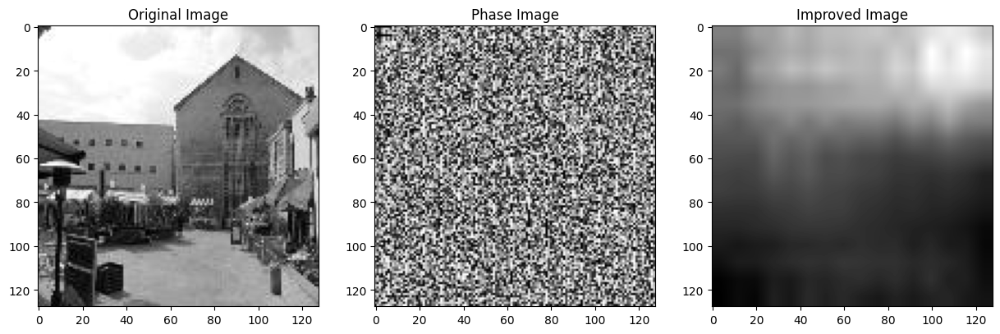

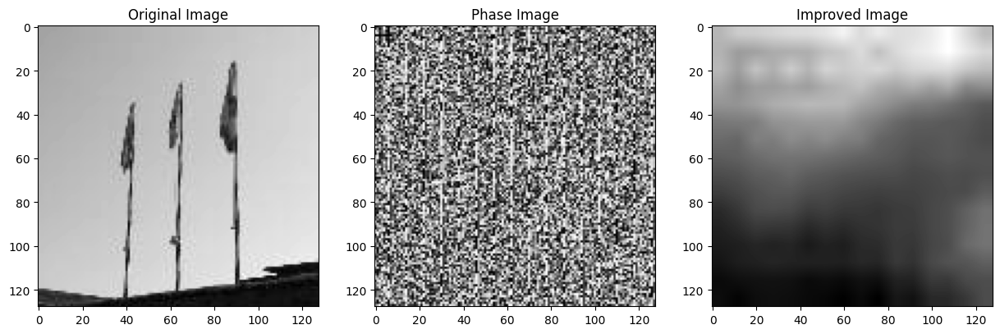

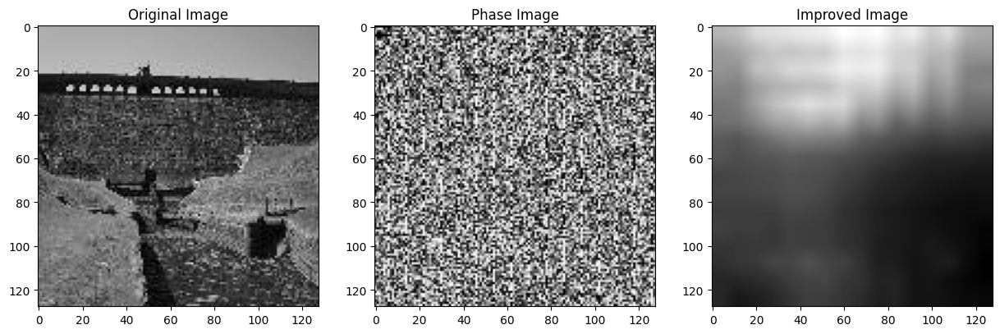

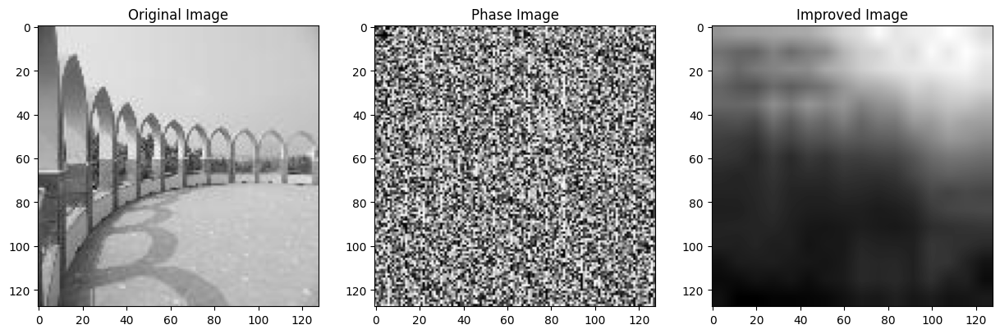

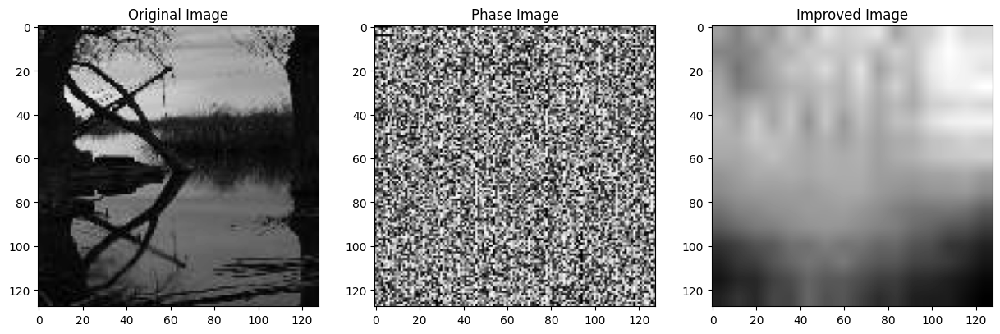

...

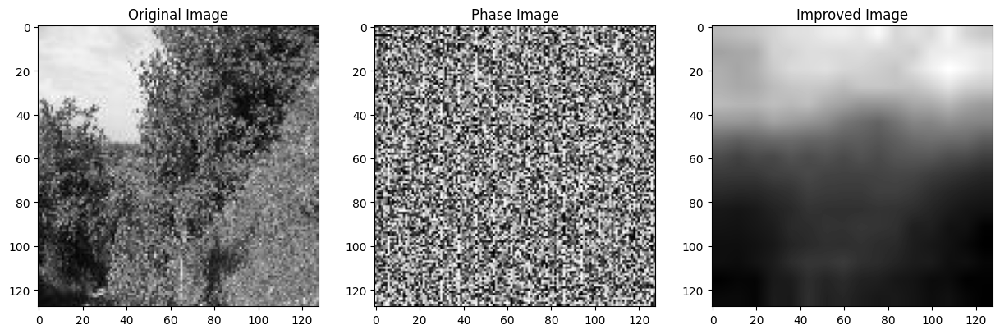

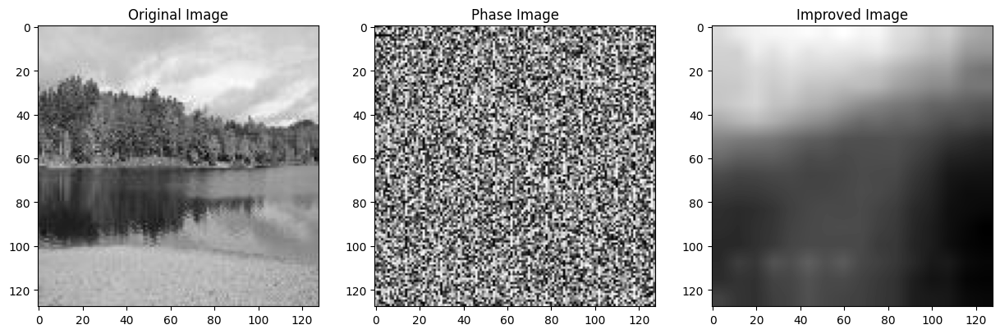

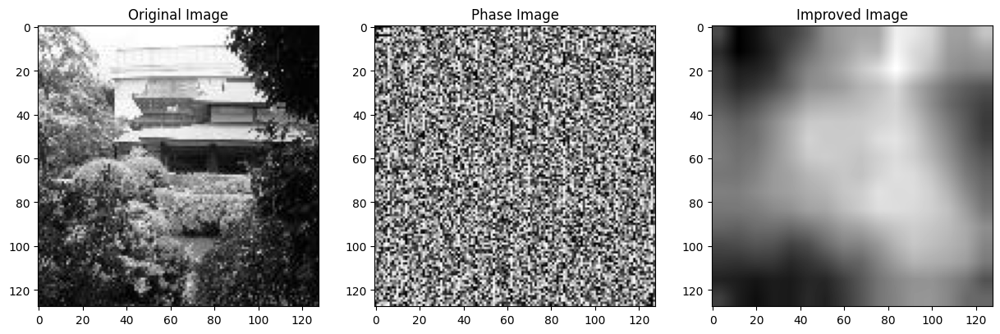

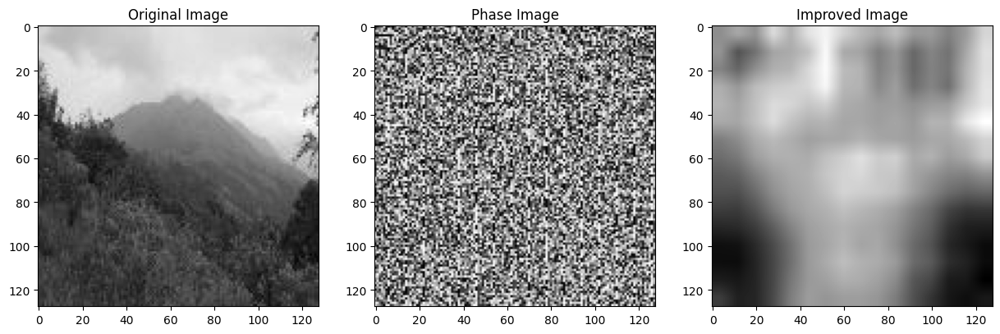

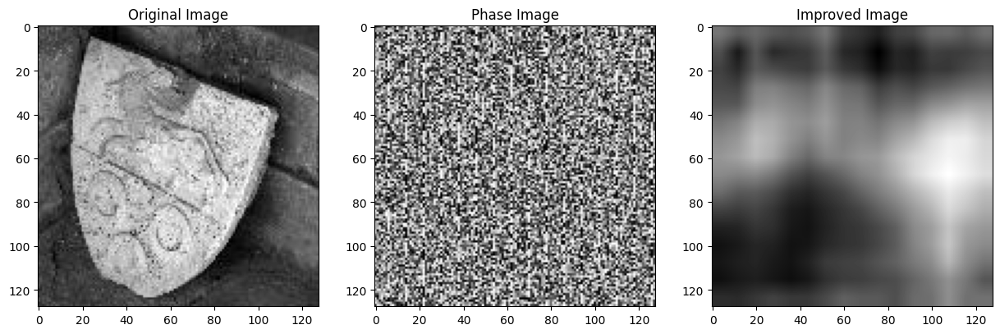

In [14]:
(_, _), (test_grayscale, test_phase) = split_dataset()

test_loader = DataLoader(list(zip(test_grayscale, test_phase)), batch_size=batch_size, shuffle=False)

reconstructed_images = []
model[0].eval()
mse_list = []
with torch.no_grad():
    for i, (grayscale, phase) in enumerate(test_loader):
        grayscale = Variable(grayscale).cuda()
        phase = Variable(phase).cuda()
        mse_list.append((model[0](phase)['out'] - grayscale).pow(2).sum().item())
        output = model[0](phase)['out']
        reconstructed_images.append(output.squeeze(0).cpu())

print(f"Average MSE: {np.mean(mse_list)}")

for i in range(20):
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))
    ax[0].imshow(test_grayscale[i].squeeze(0), cmap='gray')
    ax[0].set_title('Original Image')

    ax[1].imshow(test_phase[i].squeeze(0), cmap='gray')
    ax[1].set_title('Phase Image')

    ax[2].imshow(reconstructed_images[i][0][0], cmap='gray')
    ax[2].set_title('Improved Image')

    plt.show()